In [1]:
# Data visualization imports
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

# Data processing imports
from scipy.stats import gaussian_kde
from scipy.signal import find_peaks
import pandas as pd
import numpy as np

## Import clustered data

In [2]:
df = pd.read_csv("my_data/clustered_data.csv")
df

,x,y,z,groove,tread,depth
0,0.15000,-0.12917,0.42000,-1,True,2.252963
1,0.15000,-0.12917,0.42000,-1,True,2.252963
2,0.14988,-0.12882,0.42000,-1,True,2.539181
3,0.14988,-0.12882,0.42000,-1,True,2.539181
4,0.14882,-0.13181,0.41882,-1,True,1.286047
...,...,...,...,...,...,...
195176,-0.13118,0.02294,0.27167,2,False,3.290156
195177,-0.13118,0.02287,0.27176,2,False,3.393917
195178,-0.13000,0.02287,0.27176,2,False,3.116971
195179,-0.12412,0.02271,0.27176,2,False,3.018646


# TASK 3: Get tread depth

Let's plot the depth histogram of our data to see if it follows any pattern:

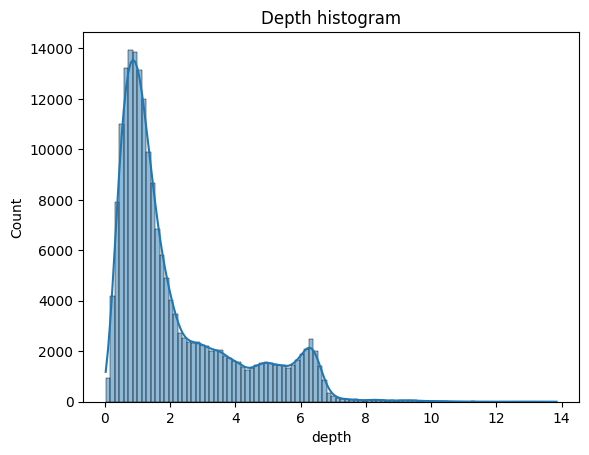

In [3]:
plt.title("Depth histogram")
sns.histplot(data=df, x="depth", bins=100, kde=True)
plt.show()

It seems like we have two peaks in our histogram, which would likely be the depth for the points o the tire surface and the depth for the points at the bottom of the grooves.

Let's get a better look to see if this is the case, by making multiple histograms according to the groove of the data points:

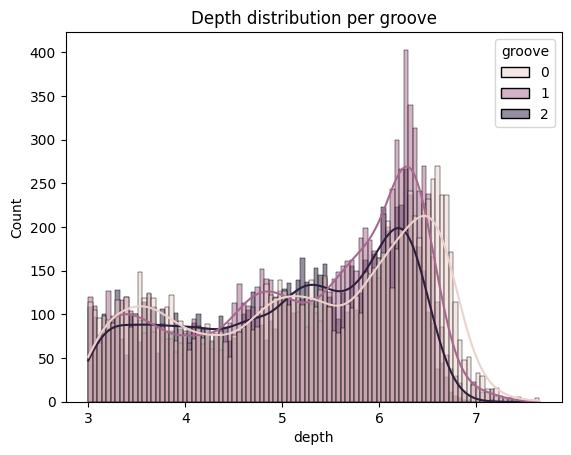

In [4]:
# Make the plot
fig, ax = plt.subplots(1, 1)
ax.set_title("Depth distribution per groove")
sns.histplot(data=df.query("groove != -1"), x="depth", hue="groove", bins=100, kde=True)
plt.show()

We can see that it does seem like the peaks of the grooves are more or less lined up in a region of high depth, which is probably the bottom of each groove!

As such, we can find estimate the tread depth per groove by finding the peaks of the KDE with maximum and minimum depth and subtracting them.

First, let's calculate the depth at the surface of the tire and plot it:

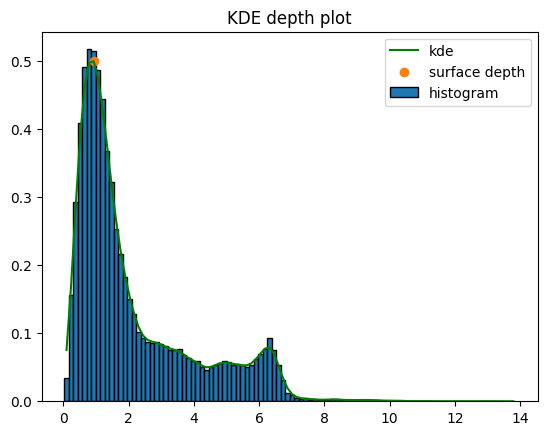

In [5]:
# Compute histogram of data
hist, edges = np.histogram(df.depth, bins=100, density=True)

# Compute kde of the data
kde = gaussian_kde(df.depth)

# Get kde peaks
x = np.array([0.5*(edges[i+1] + edges[i]) for i in range(hist.shape[0])])
peaks, _ = find_peaks(kde(x), height=0.05)
surface_depth = x[min(peaks)]

# Plot the kde
plt.title("KDE depth plot")
plt.bar(x, hist, width=np.diff(edges), ec="k", label="histogram")
plt.plot(x, kde(x), color="green", label="kde")
plt.scatter(surface_depth, kde(surface_depth), label="surface depth")
plt.legend()
plt.show()

Now let's use the same procedure to calculate the depth at the bottom of each groove:

In [6]:
groove_depth = {}

# Calculate depth per groove
grooves = [groove for groove in df.groove.unique() if groove != -1]
for groove in grooves:
    # Filter dataframe for that groove
    groove_df = df.query(f"groove == {groove}")
    
    # kde on the groove data
    x = groove_df.depth
    kde = gaussian_kde(x)
    
    # Get peak
    x = np.linspace(x.min(), x.max(), 100)
    peaks, _ = find_peaks(kde(x), height=0.3)
    depth = x[max(peaks)]
    groove_depth[groove] = depth
    
pd.DataFrame({"groove": [k for k in groove_depth], "depth (mm)": [v for v in groove_depth.values()]})

,groove,depth (mm)
0,0,6.472298
1,1,6.260288
2,2,6.198247


In [7]:
tread_depth = {groove: groove_depth[groove] - surface_depth for groove in grooves}
pd.DataFrame({"groove": [k for k in tread_depth], "tread depth (mm)": [v for v in tread_depth.values()]})

,groove,tread depth (mm)
0,0,5.549927
1,1,5.337917
2,2,5.275875


In [8]:
# Calculate edge difference
edge_diff = edges[1] - edges[0]

# Get minimum peak dataframe
min_bounds = (surface_depth - 3 * edge_diff, surface_depth + 3 * edge_diff)
min_idx = (df.depth > min_bounds[0]) & (df.depth < min_bounds[1])
min_depth_df = df.loc[min_idx, :]
data = [
    go.Scatter3d(
        x=min_depth_df.x, 
        y=min_depth_df.y, 
        z=min_depth_df.z, 
        name="Surface", 
        mode="markers", 
        marker=dict(size=2, color="red")
    )
]

# Define auxiliary variables for groove plotting
idx = min_idx
colors = ["white", "yellow", "blue"]

# Create plot data for each groove
for color, groove in zip(colors, grooves):
    # Filter dataframe per groove
    groove_df = df.query(f"groove == {groove}")
    
    # Filter groove dataframe around its bottom
    max_peak = groove_depth[groove]
    max_bounds = (max_peak - 3 * edge_diff, max_peak + 3 * edge_diff)
    max_idx = (df.groove == groove) & (df.depth > max_bounds[0]) & (df.depth < max_bounds[1])
    max_depth_df = df.loc[max_idx, :]
    
    # Add groove data to plot
    data.append(
        go.Scatter3d(
            x=max_depth_df.x, 
            y=max_depth_df.y, 
            z=max_depth_df.z, 
            name=f"Bottom groove {groove}", 
            mode="markers", 
            marker=dict(size=2, color=color)
        )
    )
    
    # Calculate mask of all selected points so far
    idx = idx | max_idx

# Get remainder points in df
idx = ~idx
rem_df = df.loc[idx, :]

# Append remaining data
data.append(
    go.Scatter3d(
        x=rem_df.x, 
        y=rem_df.y, 
        z=rem_df.z, 
        name="Remaining", 
        mode="markers", 
        marker=dict(size=2, color="black")
    )
)

# Plot the data
fig = go.Figure(data=data)
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()